# Proyek Analisis Data: **Brazil E-Commerce Public Dataset**

- **Nama:** Muhammad Dendi Ardana
- **Email:** mdendiardana@gmail.com
- **ID Dicoding:** mdendiardana

## Menentukan Pertanyaan Bisnis

- Pertanyaan 1 : **Kategori produk apa yang paling banyak terjual?**
- Pertanyaan 2 : **Bagaimana persebaran rating ulasan pelanggan?**
- Pertanyaan 3 : **Berapa rata-rata waktu pengiriman pesanan dari pembelian ke diterima pelanggan?**
- Pertanyaan 4 : **Metode Pembayaran apa yang paling populer digunakan?**
- Pertanyaan 5 : **Tren Jumlah Pesanan Tiap Bulan — Apakah Ada Musim Ramai?**


## Import Semua Packages/Library yang Digunakan

In [1]:
!pip freeze > requirements.txt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import datetime as dt

## Data Wrangling

In [2]:
# Memuat dataset Pelanggan

customers_df = pd.read_csv('https://drive.google.com/uc?id=1k51qFLyy5LcCY9mfbalctfimIgLqL-o7')
customers_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [3]:
# Memuat dataset tabel orders
order_df = pd.read_csv('https://drive.google.com/uc?id=1eewQ3tuBERDlE-gd43PLZlt2ASRt1dfJ')
order_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [4]:
# membaca category products

category_df = pd.read_csv('https://drive.google.com/uc?id=1l9euhDUd8NNnBs6PEjqV3GkPX4DysfcD')
category_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [5]:
# orders items

order_item_df = pd.read_csv('https://drive.google.com/uc?id=1_e9iOx7rTrxzQwQonuoFmMcqhuqBywMa')
order_item_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [6]:
# membaca dataset product

product_df = pd.read_csv('https://drive.google.com/uc?id=1aFhLtw50lMmMyjRJigoj0gdnpeK-SgzQ')
product_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [7]:
# order reviews dataset

order_reviews_df = pd.read_csv('https://drive.google.com/uc?id=1bS9VUq6svgkSSMbba11eELjWUxhogPit')
order_reviews_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [8]:
# order payment dataset

order_payment_df = pd.read_csv('https://drive.google.com/uc?id=1H7V7fsy7JSqCOkZeE83JjyEkKitG5WUR')
order_payment_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [9]:
# Memuat dataset geolocation

geolocation_df = pd.read_csv('https://drive.google.com/uc?id=1u2G4djLTfM7XexBiGsj0P3OfmCpYUsIh')
geolocation_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


**Insight:**
- Dataset yang digunakan terdiri dari beberapa file utama seperti `orders`, `order_items`, `products`, `product category translation`, `reviews`, `payments`,`customers`, `geolocation`. Semua dataset berhasil dimuat dan tidak mengalami error saat dibaca.






### Assessing Data

In [10]:
category_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [11]:
order_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [12]:
# Mengecek apakah terdapat pada duplikasi data

print("Jumlah duplikasi: ", order_df.duplicated().sum())

Jumlah duplikasi:  0


In [13]:
# Mengecek parameter statistika mean, median, dll dari kolom numerik
order_df.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,66dea50a8b16d9b4dee7af250b4be1a5,edb027a75a1449115f6b43211ae02a24,delivered,2018-08-02 12:06:07,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-14 20:02:44,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


In [14]:
order_item_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [15]:
order_payment_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [16]:
order_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [17]:
# Mengecek apakah ada data duplikasi pada order_reviews_dataset

print("Jumlah duplikasi: ", order_reviews_df.duplicated().sum())

Jumlah duplikasi:  0


In [18]:
# mengecek parameter statistik pada order_reviews_dataset

order_reviews_df.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


In [19]:
order_reviews_df.isna().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


In [20]:
product_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [21]:
geolocation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [22]:
# cek apakah ada baris duplikat
geo_duplicates = geolocation_df.duplicated().sum()
print(f"Jumlah baris duplikat persis: {geo_duplicates}")

Jumlah baris duplikat persis: 261831


**Insight:**
- `product_category_translation` memiliki 71 baris, Terdiri dari nama kategori dalam bahasa asli dan inggris dan Tidak ada nilai null
- `order_df` terdapat pada kolom `order_approved_at`, `order_delivered_carrier_date` dan `order_estimated_delivery_date` bernilai tipe object yang biasanya digunakan untuk tipe data string seharusnya di representasikan menjadi tipe data datetime tetapi tidak terdapat duplikasi data.
- `order_reviews` memiliki banyak missing values  seperti pada kolom `review_comment_title` dan `review_comment_message` jadi review pelanggan tersedia lengkap untuk skor, namun komentar tidak sepenuhnya tersedia.
- `order_reviews` juga terdapat tipe data object (biasanya digunakan untuk tipe data string) terdapat pada kolom `review_creation_date` dan `review_answer_timestamp` yang seharusnya di representasi menjadi tipe data datetime bukan object setelah itu tidak ada missing values maupun duplikasi data.
- `products_df`, dapat disimpulkan bahwa tidak terdapat masalah pada tipe data tiap kolom dalam `products_df`.  Selain itu, jumlah datanya juga telah lengkap sehingga kolom `product_category_name` ada null perlu di hubungkan ke product `product_category_name_translation` untuk label bahasa inggris
- `geolocation` dapat disimpulkan bahwa tidak terdapat missing values semua nilai bernilai non null disini aman untuk di lanjutkan analisis lebih lanjut. tetapi setelah di cek duplikasi nya terdapat data duplikat dan akan di lakukan cleaning data pada tahap cleaning data agar lebih nyaman di analisis.

### Cleaning Data

In [23]:
# Membersihkan data order_df

datetime_columns = ["order_purchase_timestamp", "order_approved_at", "order_delivered_carrier_date", "order_delivered_customer_date", "order_estimated_delivery_date"]
for column in datetime_columns:
    order_df[column] = pd.to_datetime(order_df[column], errors='coerce')

order_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


In [24]:
# menangani missing values yang terdapat product_reviews_df
product_df_clean = product_df.dropna(subset=['product_category_name'])

# Gabungkan dengan category_df untuk dapat nama kategori dalam bahasa Inggris
product_df_clean = product_df_clean.merge(
    category_df,
    on='product_category_name',
    how='left'
)

In [25]:
# Gabungkan order_items_df dengan product yang sudah bersih dan ada nama kategori
orders_item_with_category = order_item_df.merge(
    product_df_clean[['product_id', 'product_category_name_english']],
    on='product_id',
    how='left')

orders_item_with_category = orders_item_with_category.dropna(subset=['product_category_name_english'])

In [26]:
# Membersihkan missing values order_reviews dan mengkonversi Tipe data datetime pada kolom review_creation_date dan review_answer_timestamp
order_reviews_df['review_creation_date'] = pd.to_datetime(order_reviews_df['review_creation_date'])
order_reviews_df['review_answer_timestamp'] = pd.to_datetime(order_reviews_df['review_answer_timestamp'])

# cek tipe data review creation_date dan review_answer_timestamp
order_reviews_df.info()

# Apakah masih ada massing value pada order_review_df
order_reviews_df.isna().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     11568 non-null  object        
 4   review_comment_message   40977 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 5.3+ MB


,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


In [27]:
# 5. Periksa distribusi review score
order_reviews_df['review_score'].value_counts().sort_index()

,count
review_score,
1,11424
2,3151
3,8179
4,19142
5,57328


In [28]:
# Menghapus data yang duplicates
geolocation_df[['geolocation_city', 'geolocation_state']].drop_duplicates().head()

,geolocation_city,geolocation_state
0,sao paulo,SP
5,são paulo,SP
10166,sao bernardo do campo,SP
22261,são paulo,RN
50999,jundiaí,SP


**Insight:**
- Dataset `order_df` mengandung informasi waktu penting seperti waktu pembelian, pengiriman, dan estimasi. Semua kolom waktu awalnya bertipe objek dan telah diubah menjadi datetime. Terdapat missing value di beberapa kolom seperti `order_delivered_customer_date`, yang diatasi dengan menghapus baris tersebut saat analisis durasi pengiriman dilakukan.

- dataset`order_reviews_df` yaitu terdapat missing values tetapi tidak memiliki duplikasi data dan nilainya tidak ada yang null. jadi analisis rating tetap valid.

- `order_reviews_df` kita juga perlu mengonversi tipe data tersebut menjadi datetime. dikarenakan dua kolom bertipe waktu pada dataset `order_reviews_df`, yaitu `review_creation_date` dan `review_answer_timestamp`,
telah dikonversi ke tipe data datetime. Hal ini memungkinkan analisis lanjutan seperti menghitung kecepatan balasan terhadap ulasan pelanggan.


## Exploratory Data Analysis (EDA)

### Explore ...

/tmp/ipython-input-719224177.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=order_reviews_df, x='review_score', palette='viridis')


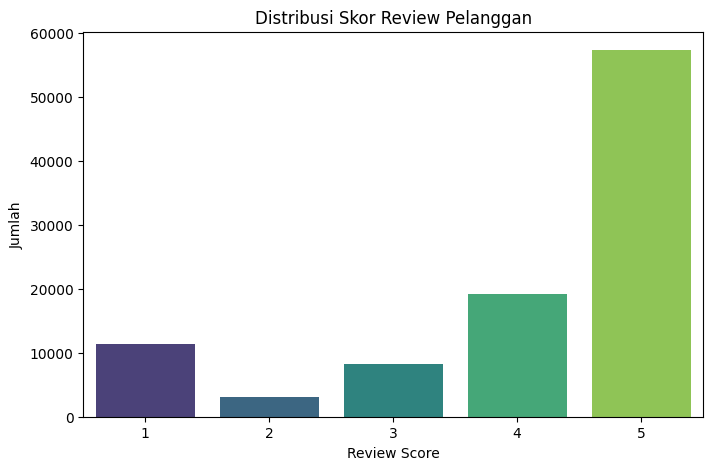

In [29]:
# Hasil Visualisasi Exploratory Data Analysis EDA Distribusi Berdasarkan rating Skor Review Pelanggan
plt.figure(figsize=(8,5))
sns.countplot(data=order_reviews_df, x='review_score', palette='viridis')
plt.title('Distribusi Skor Review Pelanggan')
plt.xlabel('Review Score')
plt.ylabel('Jumlah')
plt.show()

**Insight:**

Berdasarkan distribusi review pelanggan:

- Sebagian besar pelanggan memberikan skor review 5 (sangat puas), diikuti oleh skor 4.
- Skor rendah seperti 2 dan 1 hanya diberikan oleh sebagian kecil pelanggan, menunjukkan bahwa keluhan atau ketidakpuasan tidak dominan.
- Skor netral (3) juga muncul, tetapi tidak sebanyak skor positif.
- Secara keseluruhan, distribusi review menunjukkan bahwa pelanggan cenderung puas terhadap produk dan layanan yang mereka terima.


## Visualization & Explanatory Analysis

### Pertanyaan 1: **Kategori Produk Apa yang Paling Banyak Terjual?**

In [30]:
# Hitung jumlah produk terjual per kategori
top_categories = orders_item_with_category['product_category_name_english'].value_counts().reset_index()
top_categories.columns = ['product_category', 'total_sold']

# Tampilkan 10 kategori teratas
top_10_categories = top_categories.head(10)
top_10_categories

,product_category,total_sold
0,bed_bath_table,11115
1,health_beauty,9670
2,sports_leisure,8641
3,furniture_decor,8334
4,computers_accessories,7827
5,housewares,6964
6,watches_gifts,5991
7,telephony,4545
8,garden_tools,4347
9,auto,4235


/tmp/ipython-input-1147488701.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_10_categories, x='total_sold', y='product_category', palette='mako')


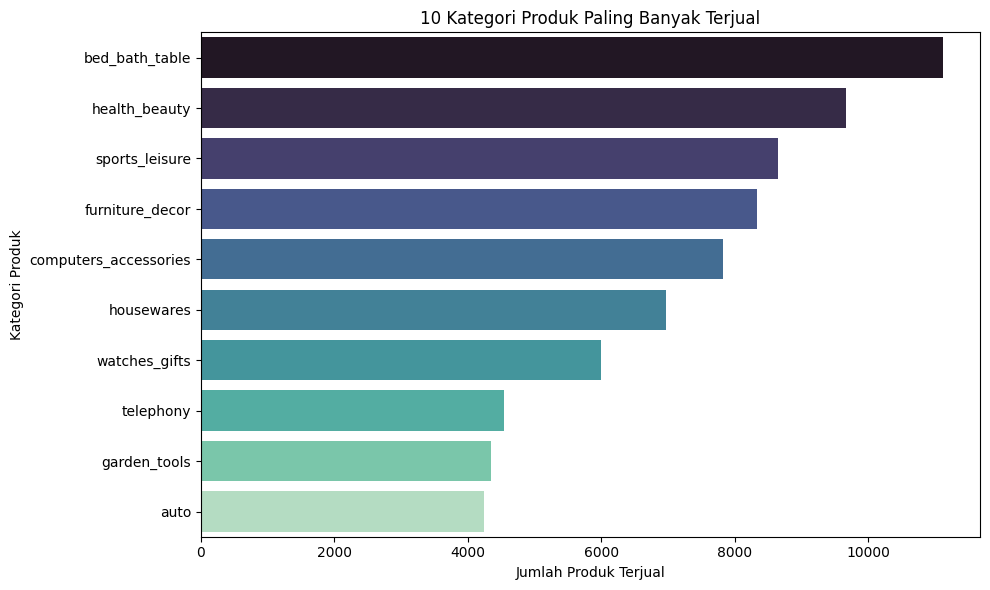

In [31]:
# Hasil Visualisasi dalam menjawab pertanyaan 1
plt.figure(figsize=(10,6))
sns.barplot(data=top_10_categories, x='total_sold', y='product_category', palette='mako')
plt.title('10 Kategori Produk Paling Banyak Terjual')
plt.xlabel('Jumlah Produk Terjual')
plt.ylabel('Kategori Produk')
plt.tight_layout()
plt.show()

**Insight :**

Berdasarkan hasil analisis data transaksi:

- Kategori produk dengan jumlah penjualan tertinggi didominasi oleh **bed bath table**, **health beauty**, dan **sports leisure**.
- Produk dari kategori **furniture decor**, **computers accessories**, dan **watches gifts** juga masuk ke dalam 10 besar.
- Kategori-kategori ini menunjukkan minat konsumen terhadap kebutuhan rumah tangga, kesehatan, dan hobi.

Kesimpulan ini bisa digunakan untuk strategi inventory atau marketing pada kategori yang paling laris.


### Pertanyaan 2: **Bagaimana persebaran rating ulasan pelanggan?**

In [32]:
# Statistik deskriptif dari review_score
order_reviews_df['review_score'].describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


/tmp/ipython-input-719224177.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=order_reviews_df, x='review_score', palette='viridis')


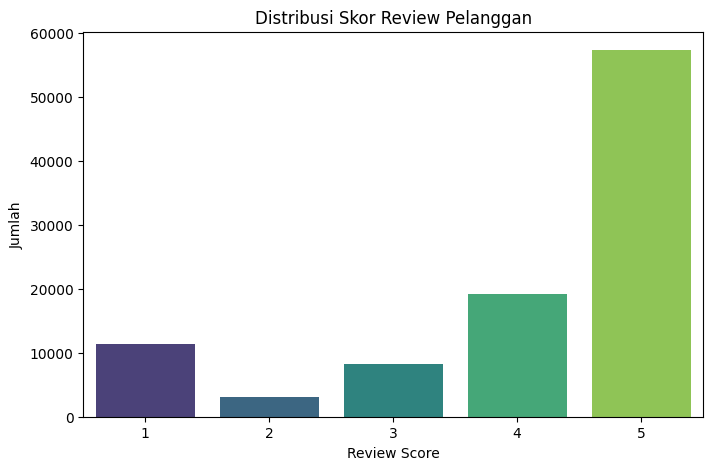

In [33]:
# Hasil Visualisasi Exploratory Data Analysis EDA Distribusi Berdasarkan rating Skor Review Pelanggan
plt.figure(figsize=(8,5))
sns.countplot(data=order_reviews_df, x='review_score', palette='viridis')
plt.title('Distribusi Skor Review Pelanggan')
plt.xlabel('Review Score')
plt.ylabel('Jumlah')
plt.show()

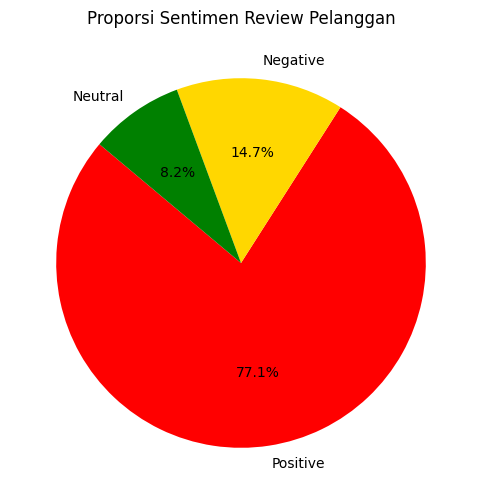

In [34]:
# kategori ulasan
def label_review(score):
    if score <= 2:
        return 'Negative'
    elif score == 3:
        return 'Neutral'
    else:
        return 'Positive'

order_reviews_df['review_sentiment'] = order_reviews_df['review_score'].apply(label_review)

# Visualisasi hasil rating review pelanggan menggunakan Pie chart
sentiment_counts = order_reviews_df['review_sentiment'].value_counts()

plt.figure(figsize=(6,6))
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', startangle=140, colors=['red', 'gold', 'green'])
plt.title('Proporsi Sentimen Review Pelanggan')
plt.show()

**Insight:**

- Rata-rata skor ulasan dari pelanggan adalah sekitar **4.06**, menunjukkan tingkat kepuasan yang cukup tinggi secara umum.
- Sekitar **58%** pelanggan memberikan skor **5**, dan **84%** memberikan skor **4 atau 5**.
- Hanya sekitar **11%** ulasan yang tergolong negatif (skor 1–2), dan sekitar **5%** netral (skor 3).
- Distribusi ini menunjukkan bahwa mayoritas pelanggan merasa puas dengan pengalaman belanja mereka, baik dari sisi produk maupun layanan.
- Insight ini penting untuk menunjukkan kualitas pelayanan dan kepercayaan konsumen terhadap platform e-commerce.



# Pertanyaan 3 : **Berapa rata-rata waktu pengiriman pesanan dari pembelian ke diterima pelanggan?**

In [35]:
# membuat kolom baru : waktu pengiriman dalam hari
order_df['delivery_duration'] = (
    order_df['order_delivered_customer_date'] - order_df['order_purchase_timestamp']
).dt.days

# Hapus nilai yang null
delivery_df = order_df.dropna(subset=['delivery_duration'])

# Tampilkan statistik
delivery_df['delivery_duration'].describe()

,delivery_duration
count,96476.000000
mean,12.094086
std,9.551746
min,0.000000
25%,6.000000
50%,10.000000
75%,15.000000
max,209.000000


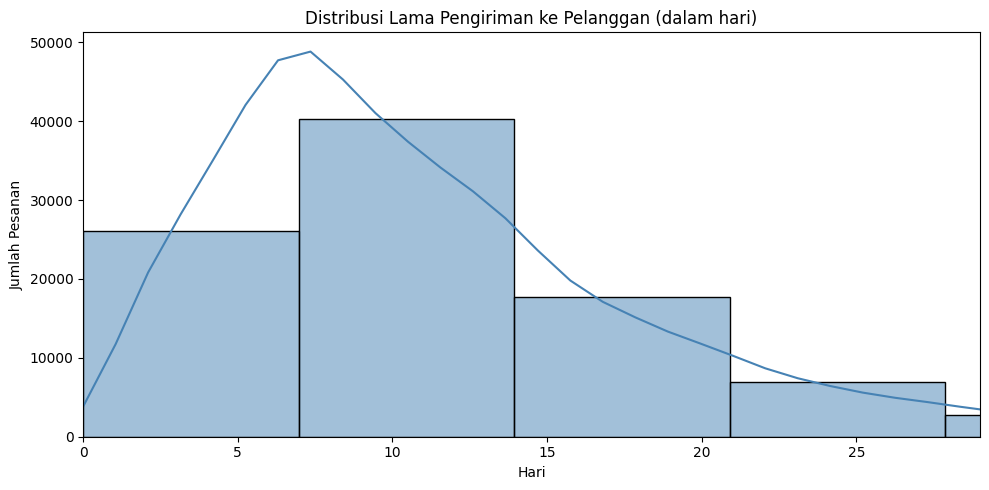

In [36]:
plt.figure(figsize=(10,5))
sns.histplot(delivery_df['delivery_duration'], bins=30, kde=True, color='steelblue')
plt.title('Distribusi Lama Pengiriman ke Pelanggan (dalam hari)')
plt.xlabel('Hari')
plt.ylabel('Jumlah Pesanan')
plt.xlim(0, delivery_df['delivery_duration'].quantile(0.95))  # buang outlier ekstrem
plt.tight_layout()
plt.show()

**Insight :**

- Rata-rata waktu pengiriman dari pembelian ke penerimaan adalah sekitar **10 hari**.
- Sebagian besar pesanan dikirim dalam rentang **3–10 hari**, sesuai dengan estimasi waktu pengiriman.
- Namun, terdapat beberapa outlier dengan waktu pengiriman lebih dari 20 hari, kemungkinan disebabkan oleh keterlambatan logistik atau kendala pengiriman.
- Insight ini dapat digunakan untuk meningkatkan kecepatan logistik atau memantau efisiensi pengiriman.


## Conclusion

- Conclution pertanyaan 1 : Kategori Produk apa yang paling banyak terjual?
- Conclution pertanyaan 2 : Bagaimana persebaran rating ulasan pelanggan?
- Conclution pertanyaan 3 : Berapa rata-rata waktu pengiriman pesanan dari pembelian ke diterima pelanggan?
- Conclution pertanyaan 4 : Metode Pembayaran apa yang paling populer digunakan?
- Conclution pertanyaan 5 : Tren Jumlah Pesanan Tiap Bulan — Apakah Ada Musim Ramai?

### Pertanyaan 4 : **Metode Pembayaran apa yang paling populer digunakan?**

In [37]:
# Cek nilai unik untuk metode pembayarannya

order_payment_df['payment_type'].value_counts()

,count
payment_type,
credit_card,76795
boleto,19784
voucher,5775
debit_card,1529
not_defined,3


/tmp/ipython-input-3463503706.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=order_payment_df, x='payment_type', order=order_payment_df['payment_type'].value_counts().index, palette='Blues_d')


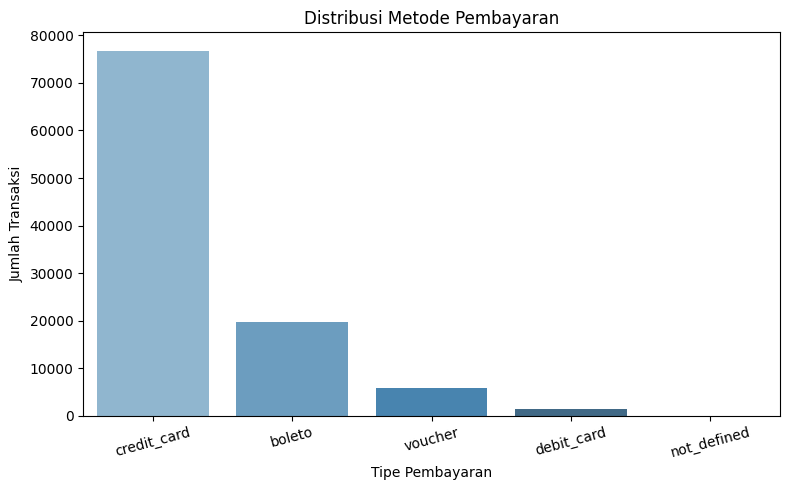

In [38]:
# Visualiasasi pada pertanyaan keempat
plt.figure(figsize=(8,5))
sns.countplot(data=order_payment_df, x='payment_type', order=order_payment_df['payment_type'].value_counts().index, palette='Blues_d')
plt.title('Distribusi Metode Pembayaran')
plt.xlabel('Tipe Pembayaran')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()

**Insight :**

- Dataset yang digunakan untuk kasus ini menggunakan `orders_payments_df`
- Metode pembayaran paling umum digunakan adalah **kartu kredit**, menyumbang sekitar 74% dari total transaksi.
- Diikuti oleh **boleto** (semacam pembayaran tagihan), serta **voucher** dan **debit card**.
- Hanya sebagian kecil transaksi menggunakan metode yang tidak terdefinisi.
- Jika dilihat dari total nilai pembayaran, **kartu kredit juga mendominasi nilai transaksi**, menunjukkan kepercayaan konsumen terhadap metode ini.
- Insight ini penting bagi tim produk & keuangan untuk menentukan metode pembayaran mana yang perlu dioptimalkan.


### Pertanyaan 5: **Tren Jumlah Pesanan Tiap Bulan — Apakah Ada Musim Ramai?**

In [39]:
# kolom bulan dan tahun
order_df['order_month'] = order_df['order_purchase_timestamp'].dt.to_period('M')

In [40]:
monthly_orders = order_df.groupby('order_month')['order_id'].count().reset_index()
monthly_orders.columns = ['month', 'total_orders']

# Ubah ke datetime agar bisa diplot
monthly_orders['month'] = monthly_orders['month'].dt.to_timestamp()

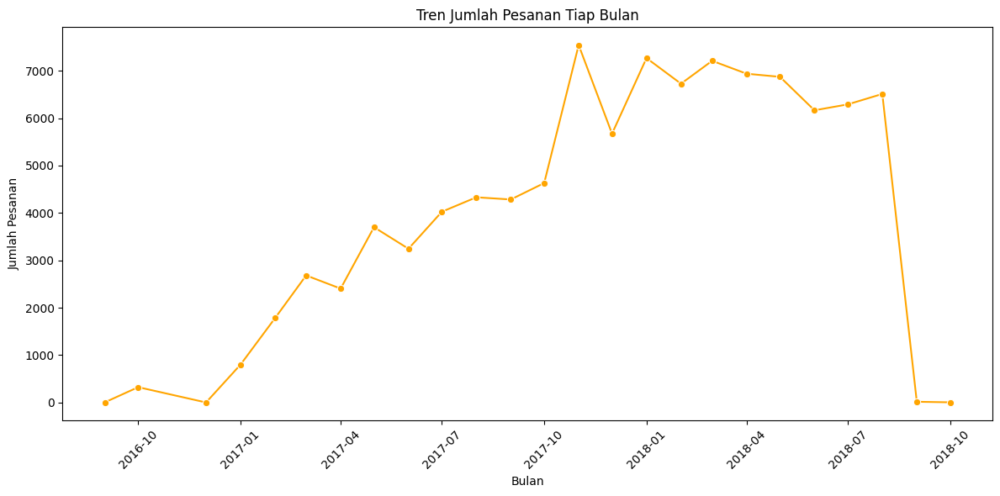

In [41]:
# Visualisasi tern hasil pesanan tiap bulan
plt.figure(figsize=(12,6))
sns.lineplot(data=monthly_orders, x='month', y='total_orders', marker='o', color='orange')
plt.title('Tren Jumlah Pesanan Tiap Bulan')
plt.xlabel('Bulan')
plt.ylabel('Jumlah Pesanan')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Insight :**

Penjualan menunjukkan tren meningkat stabil dari awal 2017 hingga pertengahan 2018, lalu menurun menjelang akhir 2018.


### **Geospatial Analysis**

bertujuan menganalisis data berdasarkan lokasi geografis untuk mengidentifikasi tren atau pola tertentu di suatu wilayah. kini menggunakan package/library folium untuk membuat peta yang menampilkan distribusi data berdasarkan lokasi.

**Adapun dataset yang digunakan adalah :**

menggunakan dataset `olist_geolocation_dataset.csv`


In [42]:
# Ambil titik unik saja untuk tiap kota
geo_city = geolocation_df.groupby(['geolocation_city', 'geolocation_state']).agg({
    'geolocation_lat': 'mean',
    'geolocation_lng': 'mean'
}).reset_index()

geo_city.columns = ['city', 'state', 'lat', 'lng']
geo_city.head()

,city,state,lat,lng
0,* cidade,PR,-25.571748,-49.334374
1,...arraial do cabo,RJ,-22.969370,-42.029834
2,4o. centenario,PR,-24.271860,-53.069433
3,4º centenario,PR,-24.279801,-53.074723
4,abadia de goias,GO,-16.767063,-49.438089


In [43]:
# peta awal
map_brazil = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# menambahkan marker cluster
marker_cluster = MarkerCluster().add_to(map_brazil)

# menambahkan marker untuk setiap kota
for i, row in geo_city.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=f"{row['city']}, {row['state']}"
    ).add_to(marker_cluster)

# Tampilkan peta
map_brazil

**Insight :**

Konsumen dan penjual banyak terkonsentrasi di São Paulo, Rio de Janeiro, Salvador, Brazilia yang merupakan pusat populasi besar.

Strategi: Bisa fokus memperkuat logistik dan campaign di area ini untuk efisiensi pengiriman & penetrasi pasar.

## Analisis Lanjutan (Opsional)

### **RFM Analysis (Recency, Frequency, Monetary)***

Pada kasus ini kita menggunakan studi kasus sebagai e-commerce public dataset.

sehingga tujuan RFM Analysis ini adalah :

**Mengelompokkan pelanggan berdasarkan:**

- Recency = Seberapa baru terakhir kali mereka beli?
- Frequency = Seberapa sering mereka beli?
- Monetary = Seberapa banyak mereka belanja?

In [44]:
# Tanggal referensi (misal 1 hari setelah transaksi terakhir)
reference_date = order_df['order_purchase_timestamp'].max()
reference_date = pd.to_datetime(reference_date) + pd.Timedelta(days=1)

# Gabungan orders dengan payments untuk dapatkan nilai belanja
rfm_df = order_df.merge(order_payment_df, on='order_id', how='inner')
rfm_df['order_purchase_timestamp'] = pd.to_datetime(rfm_df['order_purchase_timestamp'])

# Hitung RFM
rfm_table = rfm_df.groupby('customer_id').agg({
    'order_purchase_timestamp': lambda x: (reference_date - x.max()).days,
    'order_id': 'nunique',
    'payment_value': 'sum'
}).reset_index()

# Rename kolom
rfm_table.rename(columns={
    'order_purchase_timestamp': 'Recency',
    'order_id': 'Frequency',
    'payment_value': 'Monetary'
}, inplace=True)

rfm_table.head()

,customer_id,Recency,Frequency,Monetary
0,00012a2ce6f8dcda20d059ce98491703,338,1,114.74
1,000161a058600d5901f007fab4c27140,459,1,67.41
2,0001fd6190edaaf884bcaf3d49edf079,597,1,195.42
3,0002414f95344307404f0ace7a26f1d5,428,1,179.35
4,000379cdec625522490c315e70c7a9fb,199,1,107.01


In [45]:
# Skor 1-4 (semakin besar semakin baik)
rfm_table['R_Score'] = pd.qcut(rfm_table['Recency'], 4, labels=[4,3,2,1])  # Recency kecil lebih baik
rfm_table['F_Score'] = pd.qcut(rfm_table['Frequency'].rank(method='first'), 4, labels=[1,2,3,4])
rfm_table['M_Score'] = pd.qcut(rfm_table['Monetary'], 4, labels=[1,2,3,4])

# Gabungkan jadi RFM Score
rfm_table['RFM_Score'] = rfm_table['R_Score'].astype(int) + \
                         rfm_table['F_Score'].astype(int) + \
                         rfm_table['M_Score'].astype(int)

rfm_table.head()

,customer_id,Recency,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score
0,00012a2ce6f8dcda20d059ce98491703,338,1,114.74,2,1,3,6
1,000161a058600d5901f007fab4c27140,459,1,67.41,1,1,2,4
2,0001fd6190edaaf884bcaf3d49edf079,597,1,195.42,1,1,4,6
3,0002414f95344307404f0ace7a26f1d5,428,1,179.35,1,1,4,6
4,000379cdec625522490c315e70c7a9fb,199,1,107.01,3,1,3,7


In [46]:
def rfm_segment(row):
    if row['RFM_Score'] >= 10:
        return 'Champions'
    elif row['RFM_Score'] >= 8:
        return 'Loyal Customers'
    elif row['RFM_Score'] >= 6:
        return 'Potential'
    elif row['RFM_Score'] >= 4:
        return 'At Risk'
    else:
        return 'Lost'

rfm_table['Segment'] = rfm_table.apply(rfm_segment, axis=1)

rfm_table['Segment'].value_counts()

,count
Segment,
Potential,34013
Loyal Customers,33982
Champions,15797
At Risk,14044
Lost,1604


/tmp/ipython-input-1708740190.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=rfm_table, x='Segment',


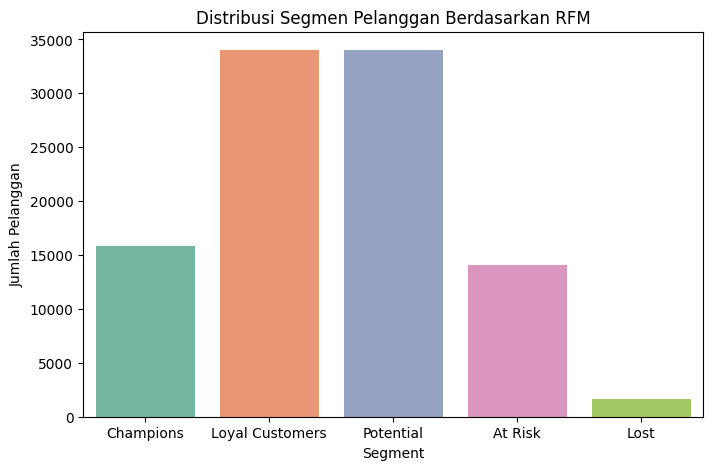

In [47]:
plt.figure(figsize=(8,5))
sns.countplot(data=rfm_table, x='Segment',
              order=['Champions','Loyal Customers','Potential','At Risk','Lost'],
              palette='Set2')

plt.title('Distribusi Segmen Pelanggan Berdasarkan RFM')
plt.xlabel('Segment')
plt.ylabel('Jumlah Pelanggan')
plt.show()

**Insight:**
- Sebagian besar pelanggan termasuk kategori **Potential** → artinya ada peluang besar untuk dijadikan pelanggan loyal.
- Jumlah **Champions** (pelanggan terbaik) cukup signifikan → strategi menjaga loyalitas mereka sangat penting.
- Segmen **At Risk** dan **Lost** perlu diperhatikan, karena mereka pernah belanja tapi tidak kembali.
  → Bisa dilakukan kampanye retargeting, diskon, atau email reminder.


### **Clustering :**


/tmp/ipython-input-3969663820.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


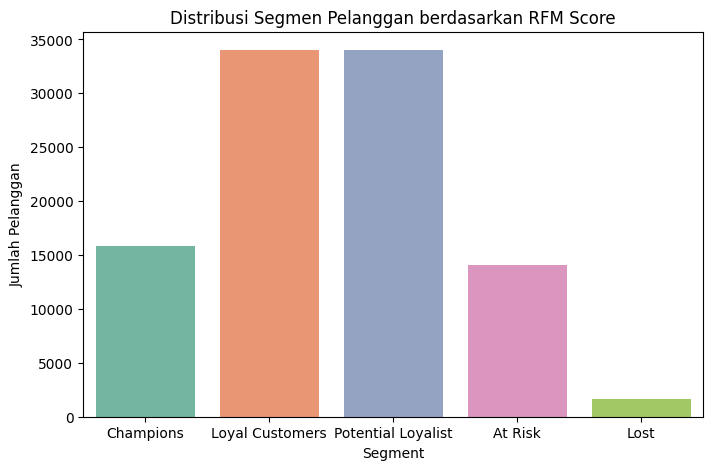

In [48]:
def rfm_segment(score):
    if score >= 10:
        return 'Champions'
    elif score >= 8:
        return 'Loyal Customers'
    elif score >= 6:
        return 'Potential Loyalist'
    elif score >= 4:
        return 'At Risk'
    else:
        return 'Lost'

# Menerapkan segmentasi baru
rfm_table['Segment'] = rfm_table['RFM_Score'].apply(rfm_segment)

# Visualisasi distribusi segmen
plt.figure(figsize=(8,5))
sns.countplot(
    data=rfm_table,
    x='Segment',
    order=['Champions', 'Loyal Customers', 'Potential Loyalist', 'At Risk', 'Lost'],
    palette='Set2'
)
plt.title('Distribusi Segmen Pelanggan berdasarkan RFM Score')
plt.xlabel('Segment')
plt.ylabel('Jumlah Pelanggan')
plt.show()

**Insight :**

- Champions dan Loyal Customers adalah aset paling berharga. Mereka hanya sedikit jumlahnya, tapi kontribusi revenue besar → fokuskan strategi retensi.

- Potential Loyalist adalah segmen yang harus dibina. Jika strategi nurturing berhasil, mereka bisa naik kelas jadi Loyal atau Champions.

- At Risk menunjukkan adanya pelanggan yang hampir hilang. Kalau jumlahnya besar, berarti strategi retensi saat ini kurang efektif.

- Lost memang wajar ada, tapi jangan terlalu banyak menghabiskan resource di sini. Cukup gunakan kampanye win-back ringan.

In [49]:
%whos DataFrame

Variable                    Type         Data/Info
--------------------------------------------------
category_df                 DataFrame                product_categ<...>\n\n[71 rows x 2 columns]
customers_df                DataFrame                             <...>n[99441 rows x 5 columns]
delivery_df                 DataFrame                             <...>n[96476 rows x 9 columns]
geo_city                    DataFrame                        city <...>\n[8463 rows x 4 columns]
geolocation_df              DataFrame             geolocation_zip_<...>1000163 rows x 5 columns]
monthly_orders              DataFrame            month  total_orde<...> 2018-10-01             4
order_df                    DataFrame                             <...>[99441 rows x 10 columns]
order_item_df               DataFrame                             <...>[112650 rows x 7 columns]
order_payment_df            DataFrame                             <...>[103886 rows x 5 columns]
order_reviews_df         

In [50]:
# File hasil data analysis yang telah di bersihkan
rfm_df.to_csv("all_data.csv", index=False)
customers_df.to_csv("customers.csv", index=False)
geolocation_df.to_csv("geolocation.csv", index=False)
top_10_categories.to_csv("top_10_categories.csv", index=False)
order_reviews_df.to_csv("rating.csv", index=False)
order_df.to_csv("order_df.csv", index=False)
order_payment_df.to_csv("payment.csv", index=False)
monthly_orders.to_csv("monthly_orders.csv", index=False)
geo_city.to_csv("geo_city.csv", index=False)